# Algorithmic trading based on Technical Analysis in Python

## Introduction

Investing was always associated with large amounts of money, both in terms of the invested amount as well as costs associated with it. Here at BUX we want to make investing accessible to everyone. That is why we recently launched BUX Zero in the Netherlands and other European countries will follow soon! BUX Zero is a zero-commission stock trading app, which makes investing not only accessible but also easy to do directly from your phone.

This is the second article on backtesting trading strategies in Python. The previous one described how to create simple backtests using custom data - in this case - EU stocks. 

This time, the goal of the article is to show how to create trading strategies based on Technical Analysis (TA in short). Quoting Wikipedia, technical analysis is a "methodology for forecasting the direction of prices through the study of past market data, primarily price, and volume".

In this article I show how to use a popular Python library for calculating TA indicators - `TA-Lib` - together with the `zipline` backtesting framework. I will create 5 strategies and see which one performs best over the same investment horizon.

By the end of the article, you will see how easy it is to backtest trading strategies based on Technical Analysis. Knowing that you can come up with custom strategies and easily implement them in practice with BUX Zero.

## Importing Libraries

In [1]:
%load_ext watermark

In [2]:
%load_ext zipline

In [3]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import zipline
import warnings
import pyfolio as pf
import empyrical as ep
from yahoofinancials import YahooFinancials
from datetime import datetime
from dateutil.relativedelta import relativedelta

# import helper functions 
import qf_helper_functions as qf

plt.style.use('seaborn')
plt.rcParams['figure.figsize'] = [16, 9]
plt.rcParams['figure.dpi'] = 200
warnings.simplefilter(action='ignore', category=FutureWarning)

Below you can see the list of libraries used in this article, together with their versions.

In [5]:
%watermark --iversions

empyrical  0.5.0
numpy      1.14.6
pyfolio    0.9.2
zipline    1.3.0
matplotlib 3.0.0
json       2.0.9
pandas     0.22.0



## Download stock prices

We begin by downloading stock prices of Unilever.

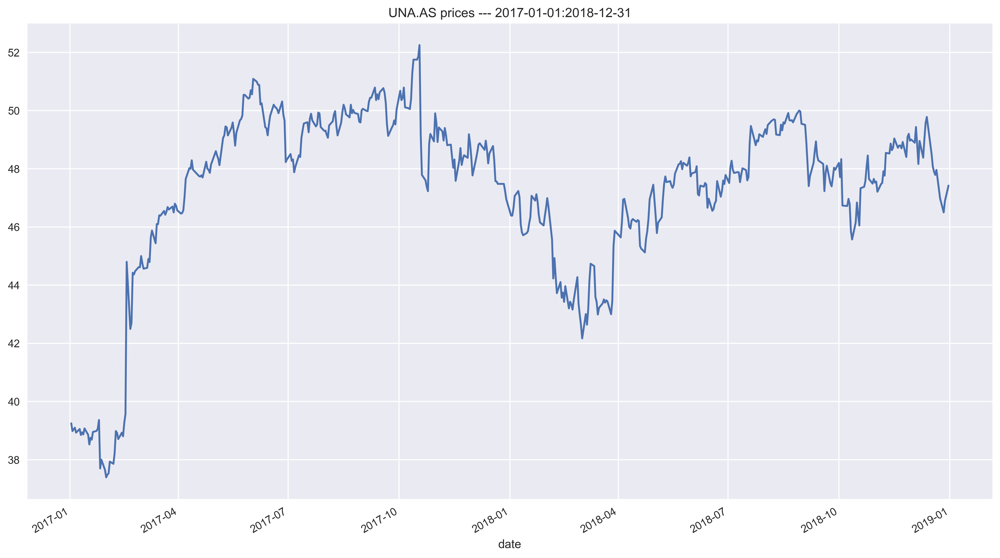

In [6]:
qf.download_csv_data(ticker='UNA.AS', 
                     start_date='2017-01-01', 
                     end_date='2018-12-31', 
                     path='european/daily/una.csv')

We also show the structure of the text file accepted by `zipline`.

In [7]:
!head ./european/daily/una.csv

date,open,high,low,close,volume,dividend,split
2017-01-02,38.95000076293945,39.40999984741211,38.89500045776367,39.25,1260307,0,1
2017-01-03,39.38999938964844,39.584999084472656,38.900001525878906,38.98500061035156,4160379,0,1
2017-01-04,39.04999923706055,39.15999984741211,38.814998626708984,39.04499816894531,2997922,0,1
2017-01-05,38.91999816894531,39.154998779296875,38.834999084472656,39.099998474121094,2928032,0,1
2017-01-06,39.0099983215332,39.05500030517578,38.73500061035156,38.93000030517578,2355566,0,1
2017-01-09,38.95000076293945,39.10499954223633,38.779998779296875,39.05500030517578,2623854,0,1
2017-01-10,39.189998626708984,39.189998626708984,38.75,38.849998474121094,3125518,0,1
2017-01-11,38.790000915527344,39.15999984741211,38.55500030517578,38.939998626708984,2849428,0,1
2017-01-12,38.7400016784668,38.94499969482422,38.630001068115234,38.869998931884766,2623966,0,1


In [8]:
!wc -l ./european/daily/una.csv

     511 ./european/daily/una.csv


And follow with the AEX index.

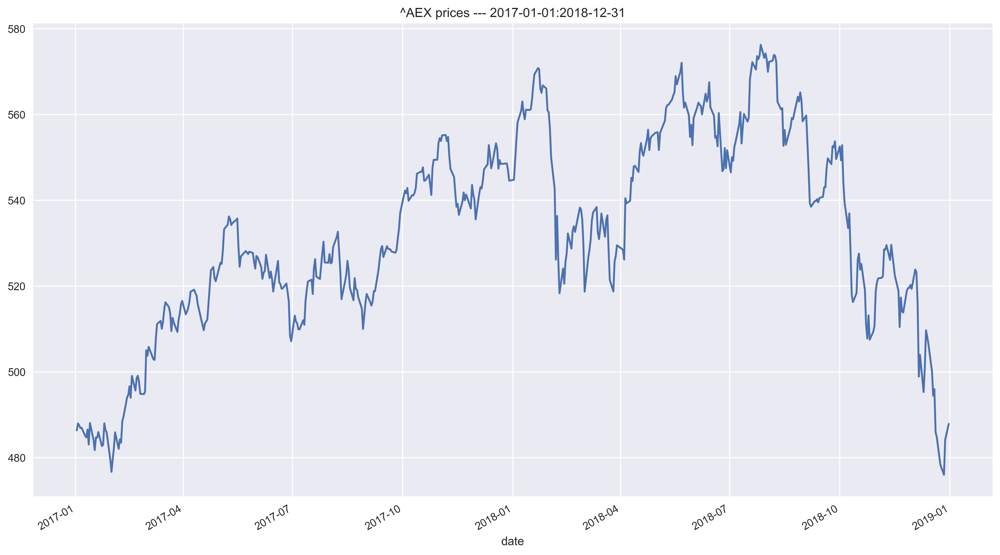

In [9]:
qf.download_csv_data(ticker='^AEX', 
                     start_date='2017-01-01', 
                     end_date='2018-12-31',
                     path='european/daily/aex.csv')

In [10]:
!wc -l ./european/daily/aex.csv

     511 ./european/daily/aex.csv


Let's inspect the currently loaded bundles:

In [11]:
!zipline bundles

csvdir <no ingestions>
eu_stocks 2019-10-11 12:45:06.752975
quandl 2019-04-22 11:07:43.501513
quandl 2019-04-22 11:00:47.961243
quantopian-quandl <no ingestions>


We will now add a custom bundle called `eu_stocks`. To do so we need to modify the `extension.py` file located in the zipline directory. We need to add the following:

In [ ]:
start_session = pd.Timestamp('2017-01-02', tz='utc')
end_session = pd.Timestamp('2019-09-30', tz='utc')

# register the bundle
register(
    'eu_stocks',  # name we select for the bundle
    csvdir_equities(
        # name of the directory as specified above (named after data frequency)
        ['daily'],
        # path to directory containing the
        '/.../medium_articles/Quantitative Finance/european',
    ),
    calendar_name='XAMS',  # Euronext Amsterdam
    start_session=start_session,
    end_session=end_session
)

In [13]:
# remove the bundle if already ingested
#!zipline clean --bundle eu_stocks --keep-last 0

In contrast to the data downloading function, we need to pass the exact range of dates of the downloaded data. In this example, we start with `2017-01-02`, as this is the first day for which we have pricing data. 

Lastly, we run the following command to ingest the bundle:

In [14]:
!zipline ingest --bundle eu_stocks

Loading custom pricing data:   [##################------------------]   50% | aex: sid 0
Loading custom pricing data:   [####################################]  100% | una: sid 1
Merging daily equity files:  [------------------------------------]  1
Merging daily equity files:  [####################################]   


And we verify that the bundle is indeed loaded:

In [15]:
!zipline bundles

csvdir <no ingestions>
eu_stocks 2019-10-14 20:13:20.190771
quandl 2019-04-22 11:07:43.501513
quandl 2019-04-22 11:00:47.961243
quantopian-quandl <no ingestions>


As one extra sanity check, we will inspect the contents of the loaded bundle, i.e., what securities are loaded and available for access.

In [16]:
import os
from zipline.utils.run_algo import load_extensions

load_extensions(
    default=True,
    extensions=[],
    strict=True,
    environ=os.environ,
)

In [17]:
from zipline.data import bundles

bundle = bundles.load('eu_stocks')
bundle.asset_finder.retrieve_all(bundle.asset_finder.sids)

[Equity(0 [AEX]), Equity(1 [UNA])]

## Strategies

In this article we use the following problem setting:
* the investor has a capital of 1000€
* the investment horizon covers year 2018
* the investor can only invest in Unilever
* we assume no transactions costs - zero-commission trading as in BUX Zero :)
* there is no short selling (the investor can only sell what he/she currently owns)
* when the investor opens a position (buys the stock), the investor goes "all in" - allocates all available resources for the purchase

### Buy And Hold Strategy

We start with the most basic strategy - Buy and Hold. The idea is that we buy a certain asset and do not do anything for the entire duration of the investment horizon. So at the first possible date, we buy as much stock as we can with our capital and do nothing later. 

This simple strategy can also be considered a benchmark for more advanced ones - because there is no point in using a very complex strategy that generates less money (in general or due to transaction costs) than buying once and doing nothing.

In [18]:
%%zipline --start 2018-1-1 --end 2018-12-31 --capital-base 1000.0 -o buy_and_hold.pkl --bundle eu_stocks --trading-calendar XAMS

# imports
from zipline.api import order_percent, symbol, record
from zipline.finance import commission

# parameters
SELECTED_STOCK = 'UNA'

def initialize(context):
    context.asset = symbol(SELECTED_STOCK)
    context.has_ordered = False  
    context.set_commission(commission.PerShare(cost=0.0, min_trade_cost=0))

def handle_data(context, data):
    
    # trading logic
    if not context.has_ordered:
        order_percent(context.asset, 1)
        context.has_ordered = True
        
    record(price=data.current(context.asset, 'price'))

,algo_volatility,algorithm_period_return,alpha,benchmark_period_return,benchmark_volatility,beta,capital_used,ending_cash,ending_exposure,ending_value,...,short_exposure,short_value,shorts_count,sortino,starting_cash,starting_exposure,starting_value,trading_days,transactions,treasury_period_return
2018-01-02 16:30:00+00:00,NaN,0.000000,NaN,0.007157,NaN,NaN,0.000000,1000.000000,0.000,0.000,...,0.0,0.0,0,NaN,1000.000000,0.000,0.000,1,[],0.0
2018-01-03 16:30:00+00:00,0.005468,-0.000487,-1.055667,0.013528,0.009341,0.585297,-974.656085,25.343915,974.169,974.169,...,0.0,0.0,0,-11.224972,1000.000000,0.000,0.000,2,"[{'amount': 21, 'commission': None, 'order_id'...",0.0
2018-01-04 16:30:00+00:00,0.052633,0.004994,3.470685,0.017800,0.024078,-2.052351,0.000000,25.343915,979.650,979.650,...,0.0,0.0,0,94.017510,25.343915,974.169,974.169,3,[],0.0
2018-01-05 16:30:00+00:00,0.070149,0.013688,2.515192,0.024582,0.020576,-1.078609,0.000000,25.343915,988.344,988.344,...,0.0,0.0,0,222.390081,25.343915,979.650,979.650,4,[],0.0
2018-01-08 16:30:00+00:00,0.060758,0.017279,1.263095,0.026456,0.035112,-0.300554,0.000000,25.343915,991.935,991.935,...,0.0,0.0,0,250.544110,25.343915,988.344,988.344,5,[],0.0
2018-01-09 16:30:00+00:00,0.074100,0.012869,-0.053853,0.028779,0.036850,0.496848,0.000000,25.343915,987.525,987.525,...,0.0,0.0,0,19.097093,25.343915,991.935,991.935,6,[],0.0
2018-01-10 16:30:00+00:00,0.144817,-0.006577,-2.275472,0.027205,0.050476,2.112032,0.000000,25.343915,968.079,968.079,...,0.0,0.0,0,-1.933370,25.343915,987.525,987.525,7,[],0.0
2018-01-11 16:30:00+00:00,0.137218,-0.012646,-2.097127,0.034700,0.050584,1.581611,0.000000,25.343915,962.010,962.010,...,0.0,0.0,0,-3.390553,25.343915,968.079,968.079,8,[],0.0
2018-01-12 16:30:00+00:00,0.128379,-0.014641,-2.088767,0.041445,0.048781,1.475874,0.000000,25.343915,960.015,960.015,...,0.0,0.0,0,-3.697580,25.343915,962.010,962.010,9,[],0.0
2018-01-15 16:30:00+00:00,0.122103,-0.013066,-1.399622,0.041445,0.051298,1.047291,0.000000,25.343915,961.590,961.590,...,0.0,0.0,0,-3.120450,25.343915,960.015,960.015,10,[],0.0


We load the performance DataFrame:

In [19]:
buy_and_hold_results = pd.read_pickle('buy_and_hold.pkl')

What can happen here (it did not, but it is good to be aware of) is the sudden appearance of negative `ending_cash`. The reason for that could be the fact that the amount of shares we want to buy is calculated at the end of the day, using that day's (closing) price. However, the order is executed on the next day, and the price can change significantly. In `zipline` the order is not rejected due to insufficient funds, but we can end up with a negative balance. This can happen mostly with strategies that go "all-in". We could come up with some ways to avoid it - for example manually calculating the number of shares we can buy the next day and also including some markup to prevent such a situation from occurring, however, for simplicity we accept that this can happen.

We use a helper function to visualize some details of the strategy: the evolution of the portfolio's value, the transactions on top of the price series, and the daily returns.

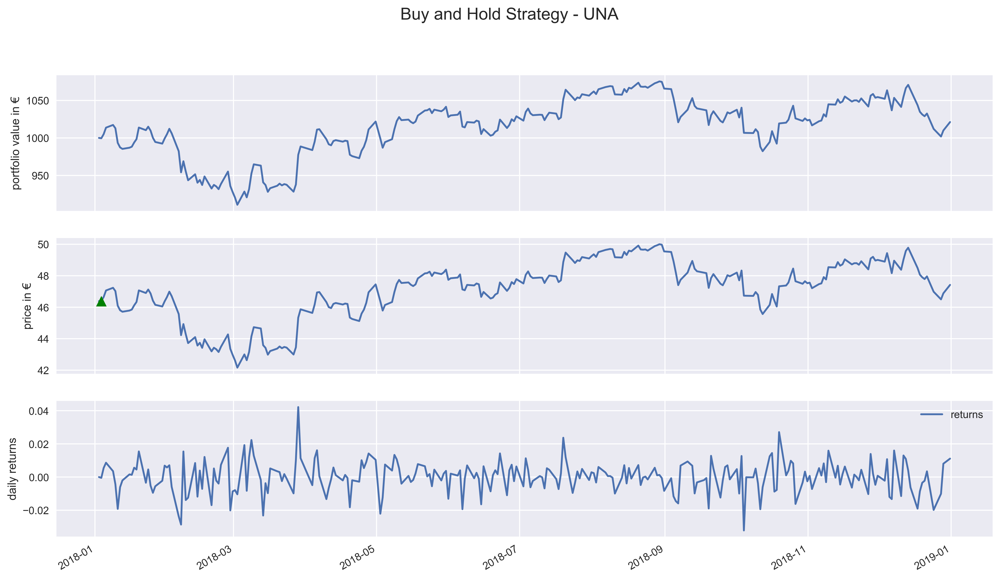

Final portfolio value (including cash): 1021.14€


In [20]:
qf.visualize_results(buy_and_hold_results, 'Buy and Hold Strategy - UNA', '€')

Start date,2018-01-02
End date,2018-12-31
Total months,12
,Backtest
Annual return,2.1%
Cumulative returns,2.1%
Annual volatility,15.2%
Sharpe ratio,0.21
Calmar ratio,0.20
Stability,0.43
Max drawdown,-10.5%


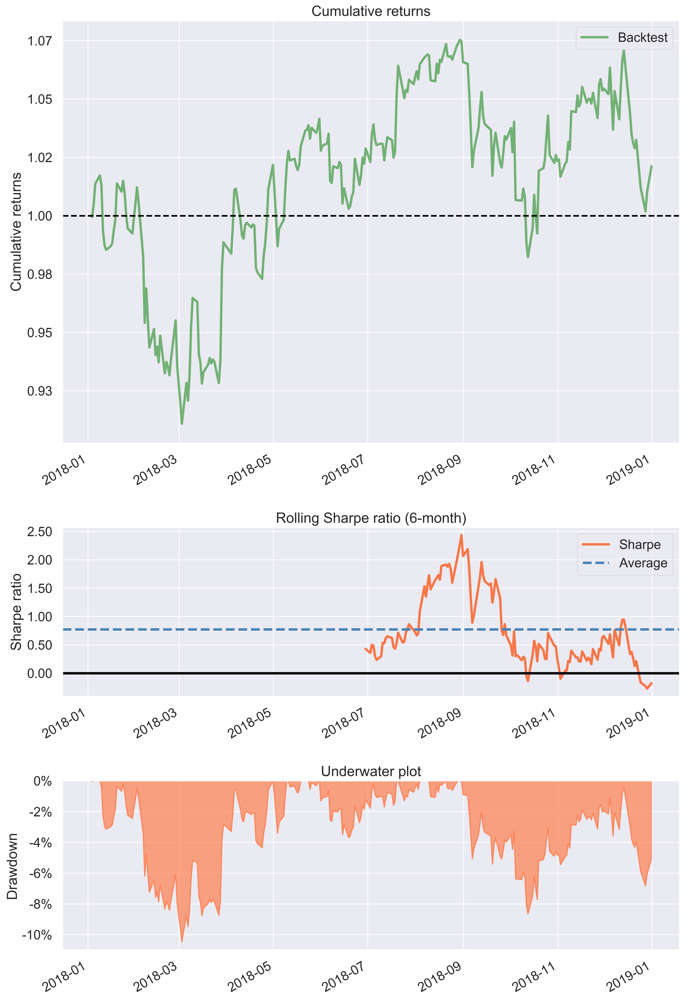

In [21]:
# possible additional summary statistics
pf.create_simple_tear_sheet(buy_and_hold_results.returns)

We also create the performance summary (using another helper function), which will be used in the last section:

In [22]:
buy_and_hold_perf = qf.get_performance_summary(buy_and_hold_results.returns)

### Simple Moving Average Strategy

The second strategy we consider is based on the simple moving average (SMA). The logic of the strategy can be summarized by the following:

* when the price crosses the 20-day SMA upwards - buy shares
* when the price crosses the 20-day SMA downwards - sell all the shares
* the moving average uses 19 prior days and the current day - trading decision is for the next day

Note: `data.current(context.asset, 'price')` is equivalent to `price_history[-1]`

In [23]:
%%zipline --start 2018-1-1 --end 2018-12-31 --capital-base 1000.0 -o simple_moving_average.pkl --bundle eu_stocks --trading-calendar XAMS

# imports 
from zipline.api import order_percent, record, symbol, order_target
from zipline.finance import commission

# parameters 
MA_PERIODS = 20
SELECTED_STOCK = 'UNA'

def initialize(context):
    context.asset = symbol(SELECTED_STOCK)
    context.set_commission(commission.PerShare(cost=0.0, min_trade_cost=0))
    context.has_position = False

def handle_data(context, data):
    
    price_history = data.history(context.asset, fields="price", bar_count=MA_PERIODS, frequency="1d")
    ma = price_history.mean()
    
    # cross up
    if (price_history[-2] < ma) & (price_history[-1] > ma) & (not context.has_position):
        order_percent(context.asset, 1.0)
        context.has_position = True
    # cross down
    elif (price_history[-2] > ma) & (price_history[-1] < ma) & (context.has_position):
        order_target(context.asset, 0)
        context.has_position = False

    record(price=data.current(context.asset, 'price'),
           moving_average=ma)

/Users/eryklewinson/anaconda3/envs/env_zipline2/lib/python3.5/site-packages/empyrical/stats.py:790: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/Users/eryklewinson/anaconda3/envs/env_zipline2/lib/python3.5/site-packages/empyrical/stats.py:704: RuntimeWarning: invalid value encountered in true_divide
  out=out,


,algo_volatility,algorithm_period_return,alpha,benchmark_period_return,benchmark_volatility,beta,capital_used,ending_cash,ending_exposure,ending_value,...,short_exposure,short_value,shorts_count,sortino,starting_cash,starting_exposure,starting_value,trading_days,transactions,treasury_period_return
2018-01-02 16:30:00+00:00,NaN,0.000000,NaN,0.007157,NaN,NaN,0.000000,1000.000000,0.000,0.000,...,0.0,0.0,0,NaN,1000.000000,0.000,0.000,1,[],0.0
2018-01-03 16:30:00+00:00,0.000000,0.000000,0.000000,0.013528,0.009341,0.000000,0.000000,1000.000000,0.000,0.000,...,0.0,0.0,0,NaN,1000.000000,0.000,0.000,2,[],0.0
2018-01-04 16:30:00+00:00,0.000000,0.000000,0.000000,0.017800,0.024078,0.000000,0.000000,1000.000000,0.000,0.000,...,0.0,0.0,0,NaN,1000.000000,0.000,0.000,3,[],0.0
2018-01-05 16:30:00+00:00,0.000000,0.000000,0.000000,0.024582,0.020576,0.000000,0.000000,1000.000000,0.000,0.000,...,0.0,0.0,0,NaN,1000.000000,0.000,0.000,4,[],0.0
2018-01-08 16:30:00+00:00,0.000000,0.000000,0.000000,0.026456,0.035112,0.000000,0.000000,1000.000000,0.000,0.000,...,0.0,0.0,0,NaN,1000.000000,0.000,0.000,5,[],0.0
2018-01-09 16:30:00+00:00,0.000000,0.000000,0.000000,0.028779,0.036850,0.000000,0.000000,1000.000000,0.000,0.000,...,0.0,0.0,0,NaN,1000.000000,0.000,0.000,6,[],0.0
2018-01-10 16:30:00+00:00,0.000000,0.000000,0.000000,0.027205,0.050476,0.000000,0.000000,1000.000000,0.000,0.000,...,0.0,0.0,0,NaN,1000.000000,0.000,0.000,7,[],0.0
2018-01-11 16:30:00+00:00,0.000000,0.000000,0.000000,0.034700,0.050584,0.000000,0.000000,1000.000000,0.000,0.000,...,0.0,0.0,0,NaN,1000.000000,0.000,0.000,8,[],0.0
2018-01-12 16:30:00+00:00,0.000000,0.000000,0.000000,0.041445,0.048781,0.000000,0.000000,1000.000000,0.000,0.000,...,0.0,0.0,0,NaN,1000.000000,0.000,0.000,9,[],0.0
2018-01-15 16:30:00+00:00,0.000000,0.000000,0.000000,0.041445,0.051298,0.000000,0.000000,1000.000000,0.000,0.000,...,0.0,0.0,0,NaN,1000.000000,0.000,0.000,10,[],0.0


In [24]:
sma_results = pd.read_pickle('simple_moving_average.pkl')

We visualize some basic information on the strategy:

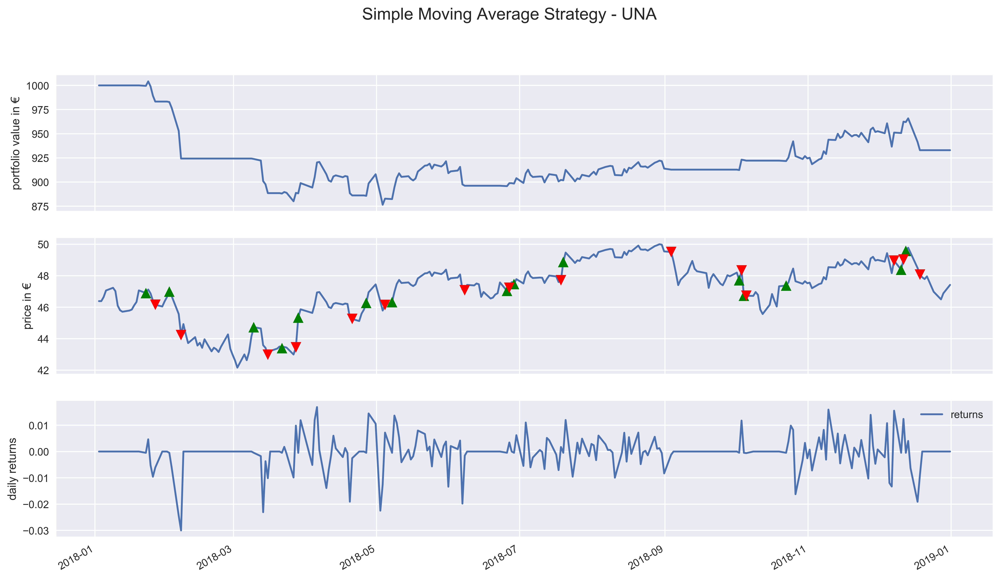

Final portfolio value (including cash): 932.98€


In [25]:
qf.visualize_results(sma_results, 'Simple Moving Average Strategy - UNA', '€')

The plot below shows the price series together with the 20-day moving average. We have additionally marked the orders, which are executed on the next trading day after the signal was generated.

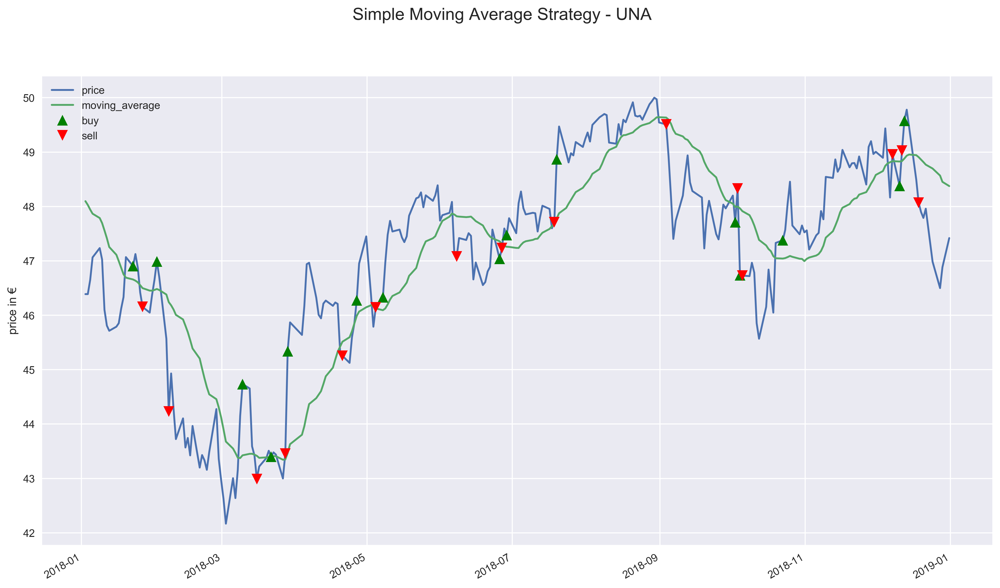

In [26]:
fig, ax = plt.subplots()

# asset
sma_results[['price', 'moving_average']].plot(ax=ax)
ax.set_ylabel('price in €')

# mark transactions
perf_trans = sma_results.loc[[t != [] for t in sma_results.transactions]]
buys = perf_trans.loc[[t[0]['amount'] > 0 for t in perf_trans.transactions]]
sells = perf_trans.loc[[t[0]['amount'] < 0 for t in perf_trans.transactions]]
ax.plot(buys.index, sma_results.price.loc[buys.index], '^', markersize=10, color='g', label='buy')
ax.plot(sells.index, sma_results.price.loc[sells.index], 'v', markersize=10, color='r', label='sell')
ax.legend()

fig.suptitle('Simple Moving Average Strategy - UNA', fontsize=16)
plt.legend()
plt.show()

In [27]:
sma_perf = qf.get_performance_summary(sma_results.returns)

### Moving Average Crossover

This strategy can be considered an extension of the previous one - instead of a single moving average, we use two averages of different window sizes. The 100-day moving average is the one that takes longer to adjust to sudden price changes, while the 20-day one is much faster to account for sudden changes.

The logic of the strategy is as follows:
* when the fast MA crosses the slow one upwards, we buy the asset
* when the slow MA crosses the fast one upwards, we sell the asset

Bear in mind that many different window-lengths combinations defining the fast and slow MA can be considered for this strategy.

In [28]:
%%zipline --start 2018-1-1 --end 2018-12-31 --capital-base 1000.0 -o moving_average_crossover.pkl --bundle eu_stocks --trading-calendar XAMS

# imports 
from zipline.api import order_percent, record, symbol, order_target
from zipline.finance import commission

# parameters 
SELECTED_STOCK = 'UNA'
SLOW_MA_PERIODS = 100
FAST_MA_PERIODS = 20

def initialize(context):
    context.asset = symbol(SELECTED_STOCK)
    context.set_commission(commission.PerShare(cost=0.0, min_trade_cost=0))
    context.has_position = False
    
def handle_data(context, data):

    fast_ma = data.history(context.asset, 'price', bar_count=FAST_MA_PERIODS, frequency="1d").mean()
    slow_ma = data.history(context.asset, 'price', bar_count=SLOW_MA_PERIODS, frequency="1d").mean()

    # Trading logic
    if (fast_ma > slow_ma) & (not context.has_position):
        order_percent(context.asset, 1.0)
        context.has_position = True
    elif (fast_ma < slow_ma) & (context.has_position):
        order_target(context.asset, 0)
        context.has_position = False

    record(price=data.current(context.asset, 'price'),
           fast_ma=fast_ma,
           slow_ma=slow_ma)

/Users/eryklewinson/anaconda3/envs/env_zipline2/lib/python3.5/site-packages/empyrical/stats.py:704: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/Users/eryklewinson/anaconda3/envs/env_zipline2/lib/python3.5/site-packages/empyrical/stats.py:790: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)


,algo_volatility,algorithm_period_return,alpha,benchmark_period_return,benchmark_volatility,beta,capital_used,ending_cash,ending_exposure,ending_value,...,short_value,shorts_count,slow_ma,sortino,starting_cash,starting_exposure,starting_value,trading_days,transactions,treasury_period_return
2018-01-02 16:30:00+00:00,NaN,0.000000,NaN,0.007157,NaN,NaN,0.000000,1000.000000,0.000,0.000,...,0.0,0,49.31362,NaN,1000.000000,0.000,0.000,1,[],0.0
2018-01-03 16:30:00+00:00,0.000000,0.000000,0.000000,0.013528,0.009341,0.000000,0.000000,1000.000000,0.000,0.000,...,0.0,0,49.28606,NaN,1000.000000,0.000,0.000,2,[],0.0
2018-01-04 16:30:00+00:00,0.000000,0.000000,0.000000,0.017800,0.024078,0.000000,0.000000,1000.000000,0.000,0.000,...,0.0,0,49.25672,NaN,1000.000000,0.000,0.000,3,[],0.0
2018-01-05 16:30:00+00:00,0.000000,0.000000,0.000000,0.024582,0.020576,0.000000,0.000000,1000.000000,0.000,0.000,...,0.0,0,49.22786,NaN,1000.000000,0.000,0.000,4,[],0.0
2018-01-08 16:30:00+00:00,0.000000,0.000000,0.000000,0.026456,0.035112,0.000000,0.000000,1000.000000,0.000,0.000,...,0.0,0,49.19821,NaN,1000.000000,0.000,0.000,5,[],0.0
2018-01-09 16:30:00+00:00,0.000000,0.000000,0.000000,0.028779,0.036850,0.000000,0.000000,1000.000000,0.000,0.000,...,0.0,0,49.16766,NaN,1000.000000,0.000,0.000,6,[],0.0
2018-01-10 16:30:00+00:00,0.000000,0.000000,0.000000,0.027205,0.050476,0.000000,0.000000,1000.000000,0.000,0.000,...,0.0,0,49.12996,NaN,1000.000000,0.000,0.000,7,[],0.0
2018-01-11 16:30:00+00:00,0.000000,0.000000,0.000000,0.034700,0.050584,0.000000,0.000000,1000.000000,0.000,0.000,...,0.0,0,49.09042,NaN,1000.000000,0.000,0.000,8,[],0.0
2018-01-12 16:30:00+00:00,0.000000,0.000000,0.000000,0.041445,0.048781,0.000000,0.000000,1000.000000,0.000,0.000,...,0.0,0,49.04557,NaN,1000.000000,0.000,0.000,9,[],0.0
2018-01-15 16:30:00+00:00,0.000000,0.000000,0.000000,0.041445,0.051298,0.000000,0.000000,1000.000000,0.000,0.000,...,0.0,0,49.00438,NaN,1000.000000,0.000,0.000,10,[],0.0


In [29]:
mac_results = pd.read_pickle('moving_average_crossover.pkl')

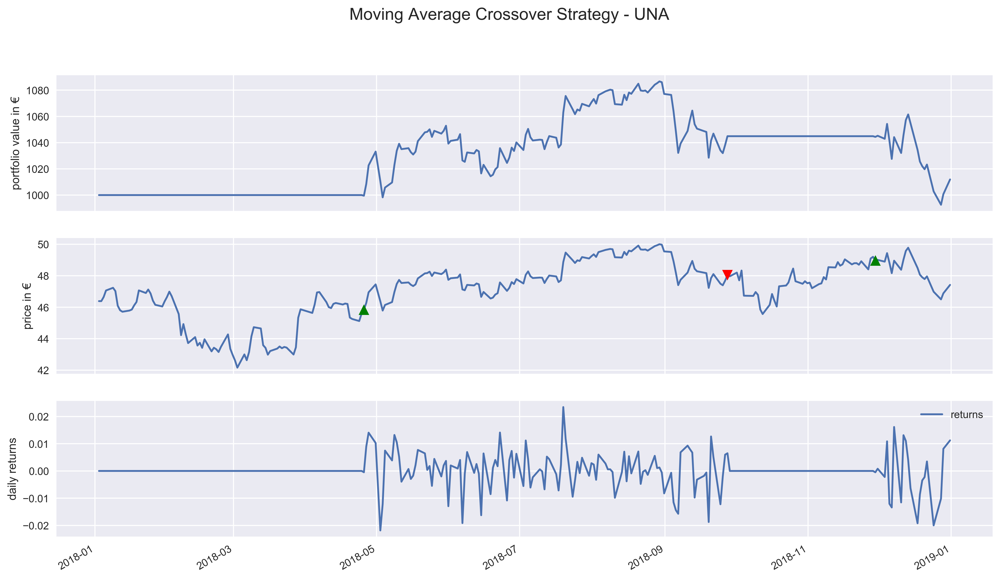

Final portfolio value (including cash): 1011.92€


In [30]:
qf.visualize_results(mac_results, 'Moving Average Crossover Strategy - UNA', '€')

Below we plotted the two moving averages on top of the price series. We see that the strategy generated much fewer signals than the one based on SMA.

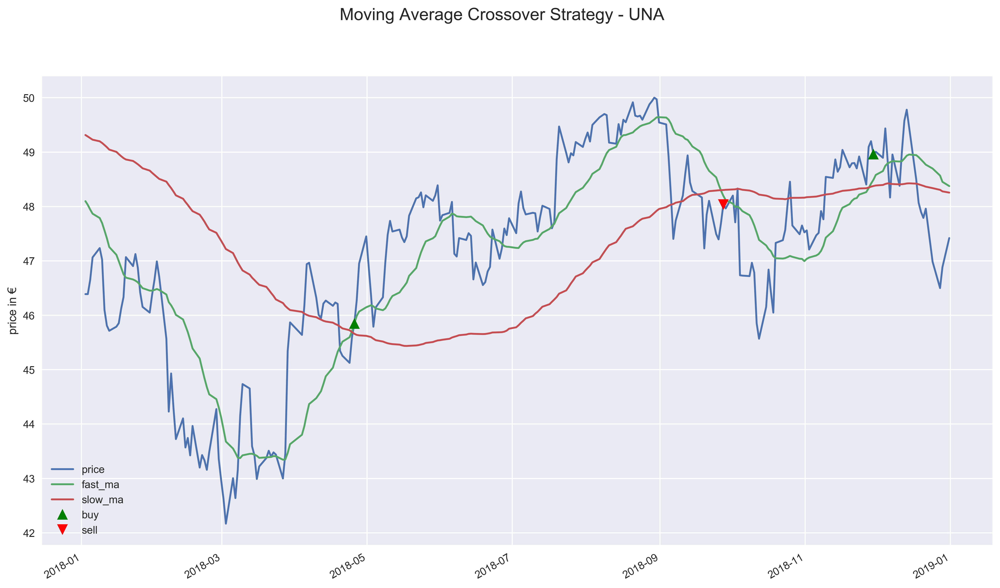

In [31]:
fig, ax = plt.subplots()

# asset
mac_results[['price', 'fast_ma', 'slow_ma']].plot(ax=ax)
ax.set_ylabel('price in €')

# mark transactions
perf_trans = mac_results.loc[[t != [] for t in mac_results.transactions]]
buys = perf_trans.loc[[t[0]['amount'] > 0 for t in perf_trans.transactions]]
sells = perf_trans.loc[[t[0]['amount'] < 0 for t in perf_trans.transactions]]
ax.plot(buys.index, mac_results.price.loc[buys.index], '^', markersize=10, color='g', label='buy')
ax.plot(sells.index, mac_results.price.loc[sells.index], 'v', markersize=10, color='r', label='sell')
ax.legend()

fig.suptitle('Moving Average Crossover Strategy - UNA', fontsize=16)
plt.legend()
plt.show()

In [32]:
mac_perf = qf.get_performance_summary(mac_results.returns)

### MACD

MACD stands for Moving Average Convergence/Divergence and is an indicator/oscillator used in technical analysis of stock prices.

MACD is a collection of three time series calculated using historical close prices:
* the MACD series - the difference between the fast (shorter period) and slow (longer period) exponential moving averages
* the signal - EMA on the MACD series
* the divergence - the difference between the MACD series and the signal

MACD is parametrized by the number of days used to calculate the three moving averages - MACD(a,b,c). a, corresponds to the fast EMA, b to the slow EMA, and c to the MACD signal EMA. The most common setup, also used in this article, is MACD(12,26,9). Historically, these numbers corresponded to 2 weeks, 1 month and 1.5 weeks based on a 6-day working week.

One thing to remember is that MACD is a lagging indicator, as it is based on moving averages. That is why the MACD is less useful for stocks that do not exhibit a trend or are trading with erratic price action.

The strategy we use in this article can be described by:
* buy shares when the MACD crosses the signal line upwards
* sell shares when the MACD crosses the signal line downwards

In [33]:
%%zipline --start 2018-1-1 --end 2018-12-31 --capital-base 1000.0 -o macd.pkl --bundle eu_stocks --trading-calendar XAMS

# imports ----
from zipline.api import order_target, record, symbol, set_commission, order_percent
import matplotlib.pyplot as plt
import talib as ta
from zipline.finance import commission

# parameters ----
SELECTED_STOCK = 'UNA'

 #initialize the strategy 
def initialize(context):
    context.asset = symbol(SELECTED_STOCK)
    context.set_commission(commission.PerShare(cost=0.0, min_trade_cost=0))
    context.has_position = False
    
def handle_data(context, data):
    
    price_history = data.history(context.asset, fields="price", bar_count=34, frequency="1d")
    macd, macdsignal, macdhist = ta.MACD(price_history, 12, 26, 9) 
    
    if (macdsignal[-1] < macd[-1]) and (not context.has_position):
        order_percent(context.asset, 1.0)
        context.has_position = True
        
    if (macdsignal[-1] > macd[-1]) and (context.has_position):
        order_target(context.asset, 0)
        context.has_position = False
        
    record(macd =  macd[-1], macdsignal = macdsignal[-1], macdhist = macdhist[-1], price=price_history[-1]) 

/Users/eryklewinson/anaconda3/envs/env_zipline2/lib/python3.5/site-packages/empyrical/stats.py:704: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/Users/eryklewinson/anaconda3/envs/env_zipline2/lib/python3.5/site-packages/empyrical/stats.py:790: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)


,algo_volatility,algorithm_period_return,alpha,benchmark_period_return,benchmark_volatility,beta,capital_used,ending_cash,ending_exposure,ending_value,...,short_exposure,short_value,shorts_count,sortino,starting_cash,starting_exposure,starting_value,trading_days,transactions,treasury_period_return
2018-01-02 16:30:00+00:00,NaN,0.000000,NaN,0.007157,NaN,NaN,0.000000,1000.000000,0.000,0.000,...,0.0,0.0,0,NaN,1000.000000,0.000,0.000,1,[],0.0
2018-01-03 16:30:00+00:00,0.000000,0.000000,0.000000,0.013528,0.009341,0.000000,0.000000,1000.000000,0.000,0.000,...,0.0,0.0,0,NaN,1000.000000,0.000,0.000,2,[],0.0
2018-01-04 16:30:00+00:00,0.000000,0.000000,0.000000,0.017800,0.024078,0.000000,0.000000,1000.000000,0.000,0.000,...,0.0,0.0,0,NaN,1000.000000,0.000,0.000,3,[],0.0
2018-01-05 16:30:00+00:00,0.000000,0.000000,0.000000,0.024582,0.020576,0.000000,0.000000,1000.000000,0.000,0.000,...,0.0,0.0,0,NaN,1000.000000,0.000,0.000,4,[],0.0
2018-01-08 16:30:00+00:00,0.000000,0.000000,0.000000,0.026456,0.035112,0.000000,0.000000,1000.000000,0.000,0.000,...,0.0,0.0,0,NaN,1000.000000,0.000,0.000,5,[],0.0
2018-01-09 16:30:00+00:00,0.000000,0.000000,0.000000,0.028779,0.036850,0.000000,0.000000,1000.000000,0.000,0.000,...,0.0,0.0,0,NaN,1000.000000,0.000,0.000,6,[],0.0
2018-01-10 16:30:00+00:00,0.000000,0.000000,0.000000,0.027205,0.050476,0.000000,0.000000,1000.000000,0.000,0.000,...,0.0,0.0,0,NaN,1000.000000,0.000,0.000,7,[],0.0
2018-01-11 16:30:00+00:00,0.000000,0.000000,0.000000,0.034700,0.050584,0.000000,0.000000,1000.000000,0.000,0.000,...,0.0,0.0,0,NaN,1000.000000,0.000,0.000,8,[],0.0
2018-01-12 16:30:00+00:00,0.000000,0.000000,0.000000,0.041445,0.048781,0.000000,0.000000,1000.000000,0.000,0.000,...,0.0,0.0,0,NaN,1000.000000,0.000,0.000,9,[],0.0
2018-01-15 16:30:00+00:00,0.000000,0.000000,0.000000,0.041445,0.051298,0.000000,0.000000,1000.000000,0.000,0.000,...,0.0,0.0,0,NaN,1000.000000,0.000,0.000,10,[],0.0


In [34]:
macd_results = pd.read_pickle('macd.pkl')

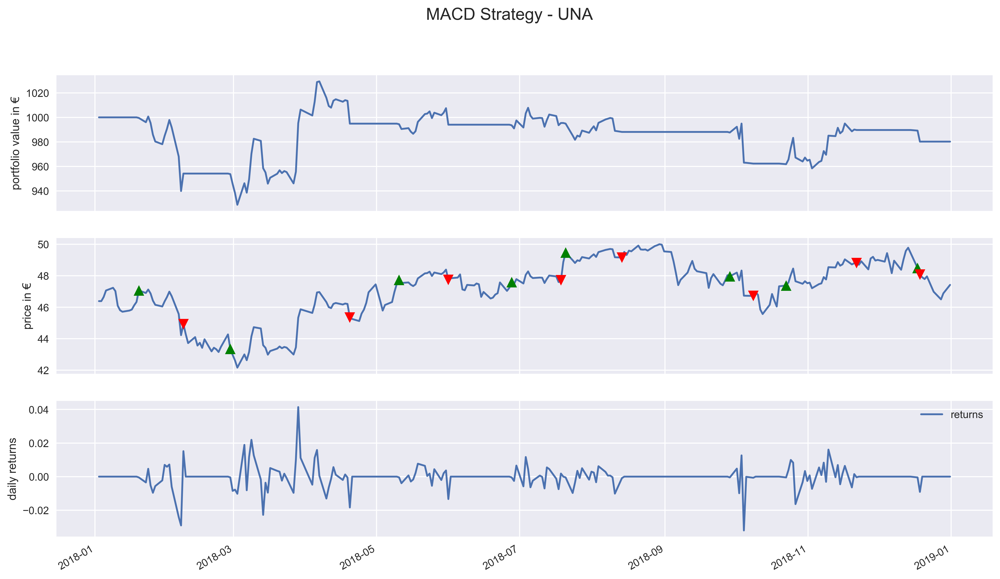

Final portfolio value (including cash): 980.21€


In [35]:
qf.visualize_results(macd_results, 'MACD Strategy - UNA', '€')

Below we plot the MACD and the signal lines, where the crossovers indicate buy/sell signals. Additionally, one could plot the MACD divergence in the form of a barplot (it is commonly referred to as the MACD histogram).

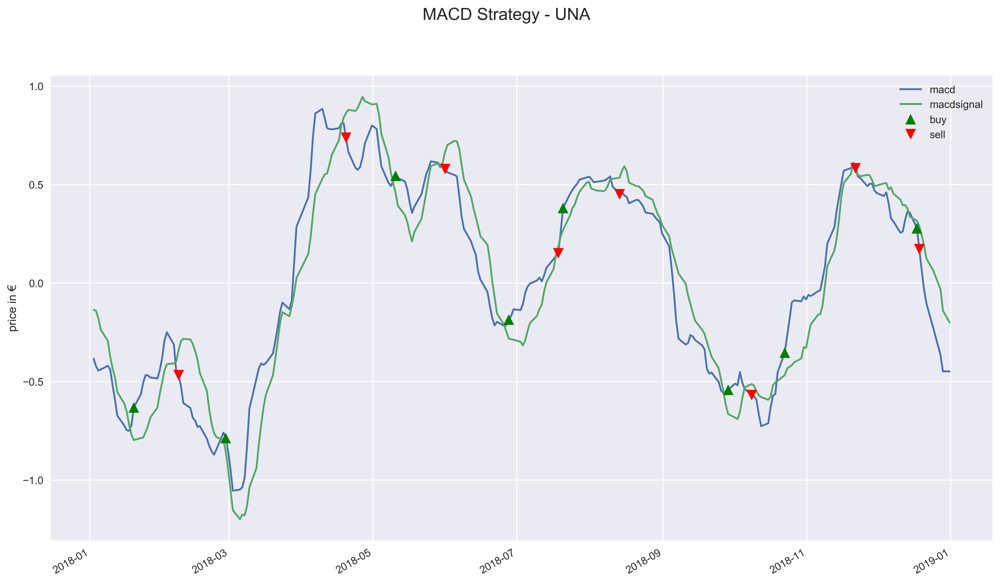

In [36]:
fig, ax = plt.subplots()

# asset
macd_results[['macd', 'macdsignal']].plot(ax=ax)
ax.set_ylabel('price in €')

# mark transactions
perf_trans = macd_results.loc[[t != [] for t in macd_results.transactions]]
buys = perf_trans.loc[[t[0]['amount'] > 0 for t in perf_trans.transactions]]
sells = perf_trans.loc[[t[0]['amount'] < 0 for t in perf_trans.transactions]]
ax.plot(buys.index, macd_results.macd.loc[buys.index], '^', markersize=10, color='g', label='buy')
ax.plot(sells.index, macd_results.macd.loc[sells.index], 'v', markersize=10, color='r', label='sell')
ax.legend()

fig.suptitle('MACD Strategy - UNA', fontsize=16)
plt.show()

In [37]:
macd_perf = qf.get_performance_summary(macd_results.returns)

### RSI 

RSI stands for the Relative Strength Index, which is another technical indicator we can use to create trading strategies. The RSI is classified as a momentum oscillator and it measures the velocity and magnitude of directional price movements. Momentum describes the rate at which the price of the asset rises or falls.

Without going into too many technical details, the RSI measures momentum as the ratio of higher closes to lower closes. Assets with more/stronger positive changes have higher RSI than assets with more/stronger negative changes.

The output of the RSI is a number on a scale from 0 to 100 and it is typically calculated on a 14-day basis. To generate the trading signals, it is common to specify the low and high levels of the RSI at 30 and 70, respectively. The interpretation of the thresholds is that the lower one indicates that the asset is oversold, and the upper one that the asset is overbought.

Sometimes, a medium level (halfway between low and high) is also specified, for example in case of strategies which also allow for short-selling. We can also select more extreme thresholds such as 20 and 80, which would then indicate stronger momentum. However, this should be specified using domain knowledge or by running backtests.

The strategy we consider can be described as:
* when the RSI crosses the lower threshold (30) - buy 
* when the RSI crosses the upper threshold (70) - sell

In [38]:
%%zipline --start 2018-1-1 --end 2018-12-31 --capital-base 1000.0 -o rsi.pkl --bundle eu_stocks --trading-calendar XAMS

# imports ----
from zipline.api import order_target, record, symbol, set_commission, order_percent
import matplotlib.pyplot as plt
import talib as ta
from zipline.finance import commission

# parameters ----
SELECTED_STOCK = 'UNA'
UPPER = 70
LOWER = 30
RSI_PERIOD = 14

#initialize the strategy 
def initialize(context):
    context.asset = symbol(SELECTED_STOCK)
    context.set_commission(commission.PerShare(cost=0.0, min_trade_cost=0))
    context.has_position = False
    
def handle_data(context, data):
    
    price_history = data.history(context.asset, fields="price", bar_count=RSI_PERIOD+1, frequency="1d")
    rsi = ta.RSI(price_history, timeperiod=RSI_PERIOD)
    
    if rsi[-1] < LOWER and not context.has_position:
        order_percent(context.asset, 1.0)
        context.has_position = True
      
    if rsi[-1] > UPPER and context.has_position:
        order_target(context.asset, 0)
        context.has_position = False
     
    record(rsi=rsi[-1], price=price_history[-1]) 

,algo_volatility,algorithm_period_return,alpha,benchmark_period_return,benchmark_volatility,beta,capital_used,ending_cash,ending_exposure,ending_value,...,short_exposure,short_value,shorts_count,sortino,starting_cash,starting_exposure,starting_value,trading_days,transactions,treasury_period_return
2018-01-02 16:30:00+00:00,NaN,0.000000,NaN,0.007157,NaN,NaN,0.000000,1000.000000,0.000,0.000,...,0.0,0.0,0,NaN,1000.000000,0.000,0.000,1,[],0.0
2018-01-03 16:30:00+00:00,0.005468,-0.000487,-1.055667,0.013528,0.009341,0.585297,-974.656085,25.343915,974.169,974.169,...,0.0,0.0,0,-11.224972,1000.000000,0.000,0.000,2,"[{'amount': 21, 'commission': None, 'order_id'...",0.0
2018-01-04 16:30:00+00:00,0.052633,0.004994,3.470685,0.017800,0.024078,-2.052351,0.000000,25.343915,979.650,979.650,...,0.0,0.0,0,94.017510,25.343915,974.169,974.169,3,[],0.0
2018-01-05 16:30:00+00:00,0.070149,0.013688,2.515192,0.024582,0.020576,-1.078609,0.000000,25.343915,988.344,988.344,...,0.0,0.0,0,222.390081,25.343915,979.650,979.650,4,[],0.0
2018-01-08 16:30:00+00:00,0.060758,0.017279,1.263095,0.026456,0.035112,-0.300554,0.000000,25.343915,991.935,991.935,...,0.0,0.0,0,250.544110,25.343915,988.344,988.344,5,[],0.0
2018-01-09 16:30:00+00:00,0.074100,0.012869,-0.053853,0.028779,0.036850,0.496848,0.000000,25.343915,987.525,987.525,...,0.0,0.0,0,19.097093,25.343915,991.935,991.935,6,[],0.0
2018-01-10 16:30:00+00:00,0.144817,-0.006577,-2.275472,0.027205,0.050476,2.112032,0.000000,25.343915,968.079,968.079,...,0.0,0.0,0,-1.933370,25.343915,987.525,987.525,7,[],0.0
2018-01-11 16:30:00+00:00,0.137218,-0.012646,-2.097127,0.034700,0.050584,1.581611,0.000000,25.343915,962.010,962.010,...,0.0,0.0,0,-3.390553,25.343915,968.079,968.079,8,[],0.0
2018-01-12 16:30:00+00:00,0.128379,-0.014641,-2.088767,0.041445,0.048781,1.475874,0.000000,25.343915,960.015,960.015,...,0.0,0.0,0,-3.697580,25.343915,962.010,962.010,9,[],0.0
2018-01-15 16:30:00+00:00,0.122103,-0.013066,-1.399622,0.041445,0.051298,1.047291,0.000000,25.343915,961.590,961.590,...,0.0,0.0,0,-3.120450,25.343915,960.015,960.015,10,[],0.0


In [39]:
rsi_results = pd.read_pickle('rsi.pkl')

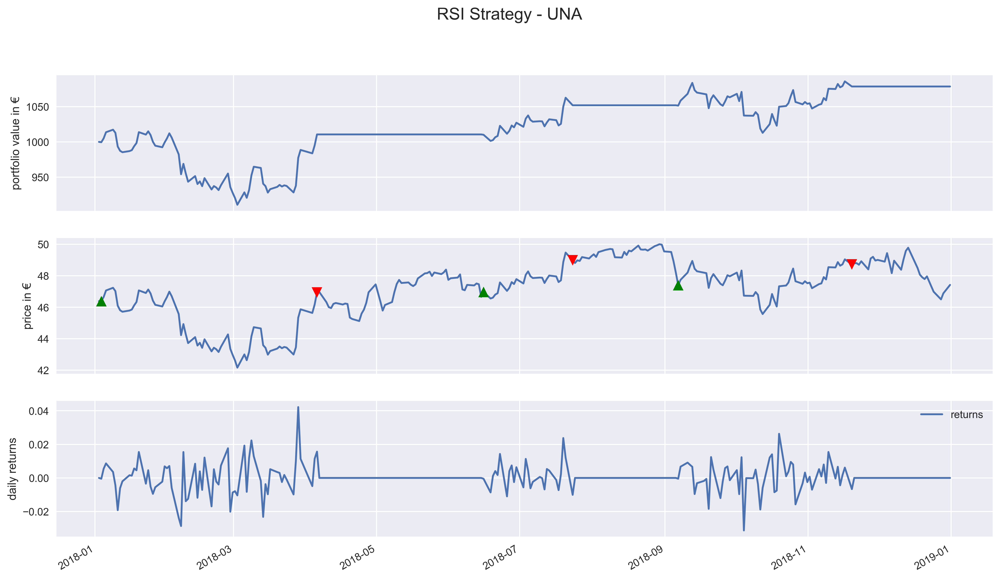

Final portfolio value (including cash): 1078.5€


In [40]:
qf.visualize_results(rsi_results, 'RSI Strategy - UNA', '€')

Below we plot the RSI together with the upper and lower threshold.

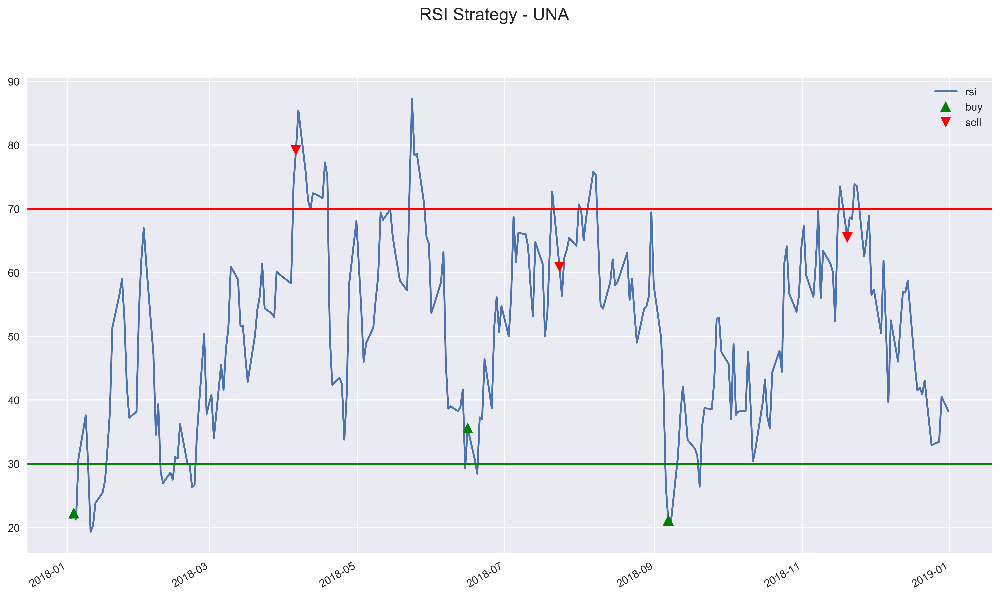

In [41]:
#fig, ax = plt.subplots(1, 1, sharex=True, figsize=[16, 9])
fig, ax = plt.subplots()

# asset
rsi_results[['rsi']].plot(ax=ax)
ax.axhline(y=70, color='r')
ax.axhline(y=30, color='g')

# mark transactions
perf_trans = rsi_results.loc[[t != [] for t in rsi_results.transactions]]
buys = perf_trans.loc[[t[0]['amount'] > 0 for t in perf_trans.transactions]]
sells = perf_trans.loc[[t[0]['amount'] < 0 for t in perf_trans.transactions]]
ax.plot(buys.index, rsi_results.rsi.loc[buys.index], '^', markersize=10, color='g', label='buy')
ax.plot(sells.index, rsi_results.rsi.loc[sells.index], 'v', markersize=10, color='r', label='sell')
ax.legend()

fig.suptitle('RSI Strategy - UNA', fontsize=16)
plt.show()

In [42]:
rsi_perf = qf.get_performance_summary(rsi_results.returns)

## Evaluating the performance

The last step involves putting all the performance metrics into one DataFrame and inspecting the results. We can see that in the case of our backtest, the strategy based on the RSI performed best in terms of generated returns. It also had the highest Sharpe ratio - the highest excess return (in this case return, as we do not consider a risk-free asset) per unit of risk. The second-best strategy turned out to be the simple Buy and Hold. It is also important to notice that two strategies - based on the MACD and SMA - actually generated losses.

In [43]:
perf_df = pd.DataFrame({'Buy and Hold': buy_and_hold_perf,
                        'Simple Moving Average': sma_perf,
                        'Moving Average Crossover': mac_perf,
                        'MACD': macd_perf,
                        'RSI': rsi_perf})
perf_df.transpose()

,annual_volatility,annualized_returns,cumulative_returns,max_drawdown,sharpe_ratio,sortino_ratio
Buy and Hold,0.152398,0.020892,0.021143,-0.104579,0.211611,0.295512
MACD,0.103362,-0.019563,-0.019793,-0.071984,-0.139664,-0.195509
Moving Average Crossover,0.093172,0.011778,0.011919,-0.086565,0.172175,0.231797
RSI,0.126035,0.077546,0.078504,-0.104579,0.655370,0.965049
Simple Moving Average,0.099633,-0.066262,-0.067024,-0.127094,-0.638180,-0.809992


## Conclusions

In this short article I showed how to combine `zipline` with `talib` in order to backtest trading strategies based on popular technical indicators such as moving averages, the MACD, the RSI, etc. But this was only the beginning, as it is possible to create much more sophisticated strategies. Some of the possible future directions:
* include multiple assets into the strategies
* allow for short-selling 
* mix the indicators
* backtest different parameters for each strategy to find the best-performing ones

We must also remember that the fact that the strategy performed well in the past is no guarantee that this will happen again in the future.